# 2D Single Person Human Pose Estimation

Megh Shukla: work.meghshukla@gmail.com

In [1]:
# Ignore syntax warning related to HRNet syntax
import warnings
warnings.filterwarnings('ignore')

# Python imports
import os
import cv2
import copy
import logging

# External package imports
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib
from matplotlib import pyplot as plt

# PyTorch imports
import torch
import torch.utils.data
from torch.utils.tensorboard import SummaryWriter
from torch.optim.lr_scheduler import ReduceLROnPlateau as ReduceLROnPlateau

# Imports from supporting files
from config import ParseConfig

from dataloader import load_hp_dataset
from dataloader import HumanPoseDataLoader

from activelearning import ActiveLearning

from evaluation import PercentageCorrectKeypoint

from utils import fast_argmax
from utils import visualize_image
from utils import heatmap_loss
from utils import count_parameters
from utils import get_pairwise_joint_distances

from train_test import Train
from train_test import Metric
from train_test import load_models
from train_test import define_hyperparams


from models.auxiliary.AuxiliaryNet import AuxNet
from models.hrnet.pose_hrnet import PoseHighResolutionNet as HRNet
from models.stacked_hourglass.StackedHourglass import PoseNet as Hourglass


logging.getLogger().setLevel(logging.INFO)

### Initializing configurations:

Model: Hourglass / HRNet <br>
Dataset: MPII / Leeds Sports Pose <br>
Load and Save paths <br>
... and much more!

Have a look at ```configuration.yml```


In [2]:
conf  = ParseConfig()

INFO:root:Saving the model at: D:\WADLA Demo\Demo_3


### Load datasets:

Based on our choice of dataset in ```configuration.yml```, we will load our selection into memory. <br>
Quick recall, different datasets have different data formats! <br>
```load_hp_dataset``` is located in ```dataloader.py```

In [3]:
dataset_dict = load_hp_dataset(dataset_conf=conf.dataset, model_conf=conf.model)

INFO:root:Loading MPII dataset
INFO:root:Loading precached MPII.


### Initialize (...and load) model architecture:

We initialize and load the model based on the choice of architecture specified in ```configuration.yml```. <br>
```load_models``` is located in ```train_test.py```

In [4]:
pose_model, aux_net = load_models(conf=conf, load_pose=conf.model['load'], load_aux=conf.model['aux_net']['load'],
                                  model_dir=conf.model['load_path'])

INFO:root:Initializing Hourglass Network
INFO:root:Loading Pose model from: D:\WADLA Demo\Pretrained_MPII_256channels\
INFO:root:Successfully loaded Pose model.


Number of parameters (Hourglass): 8429088



INFO:root:Successful: Model transferred to GPUs.



### Define the active learning library:

Although we won't be doing active learning, the library will allow us to draw samples randomly for training the model. <br>
The class ```ActiveLearning``` is located in ```activelearning.py```.

In [5]:
activelearning = ActiveLearning(conf=conf, pose_net=pose_model, aux_net=aux_net)

### Creating an object that inherits from torch.utils.data.Dataset()

Writing code in PyTorch is fairly simple, and PyTorch requires two objects that need to be explicitly coded: _model_ and _dataset_. <br>
For our scenario, we create an object of type ```HumanPoseDataLoader``` for handling our dataset. <br>

```datasets``` standardizes ```mpii``` and ```lsp``` into a common format, defines augmentation routines, calls ```activelearning``` to sample from this data, and also controls preprocessing at batch level.

```HumanPoseDataLoader``` is located in ```dataloader.py```

In [6]:
datasets = HumanPoseDataLoader(dataset_dict=dataset_dict, activelearning=activelearning, conf=conf)

INFO:root:Creating MPII dataset

INFO:root:MPII dataset description:
INFO:root:Length (#images): 15247
INFO:root:Creating single person patches

INFO:root:Selecting train and validation images where all joints are present.

INFO:root:Size of MPII processed dataset: 
INFO:root:Train: 10614
INFO:root:Validate: 2416

INFO:root:Creating train and validation splits

INFO:root:Initializing base dataset.
INFO:root:
Final size of Training Data: 1000
INFO:root:Final size of Validation Data: 2416

INFO:root:
Dataloader Initialized.



Once we initialize our dataloader, we delete a few objects that we won't need any longer to clear memory. <br>
Deleting the models gets rid of any computational graphs computed during ```ActiveLearning``` which we don't require any longer.

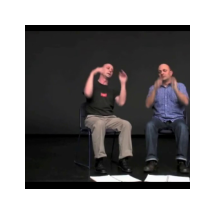

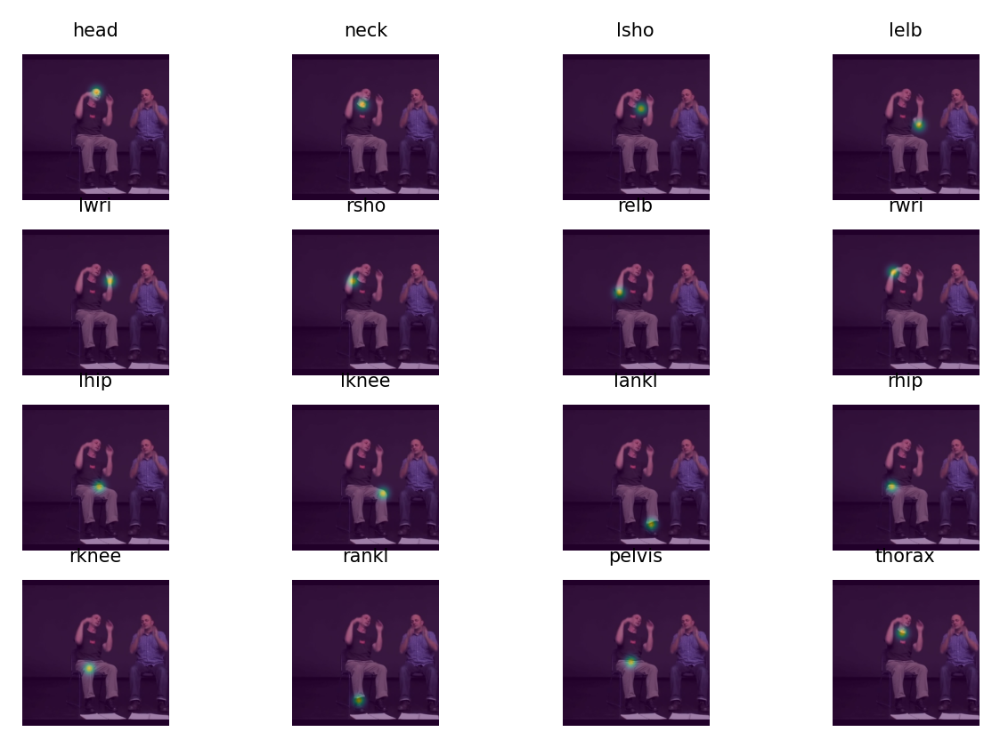

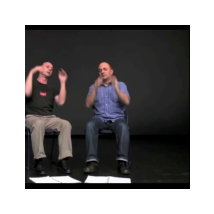

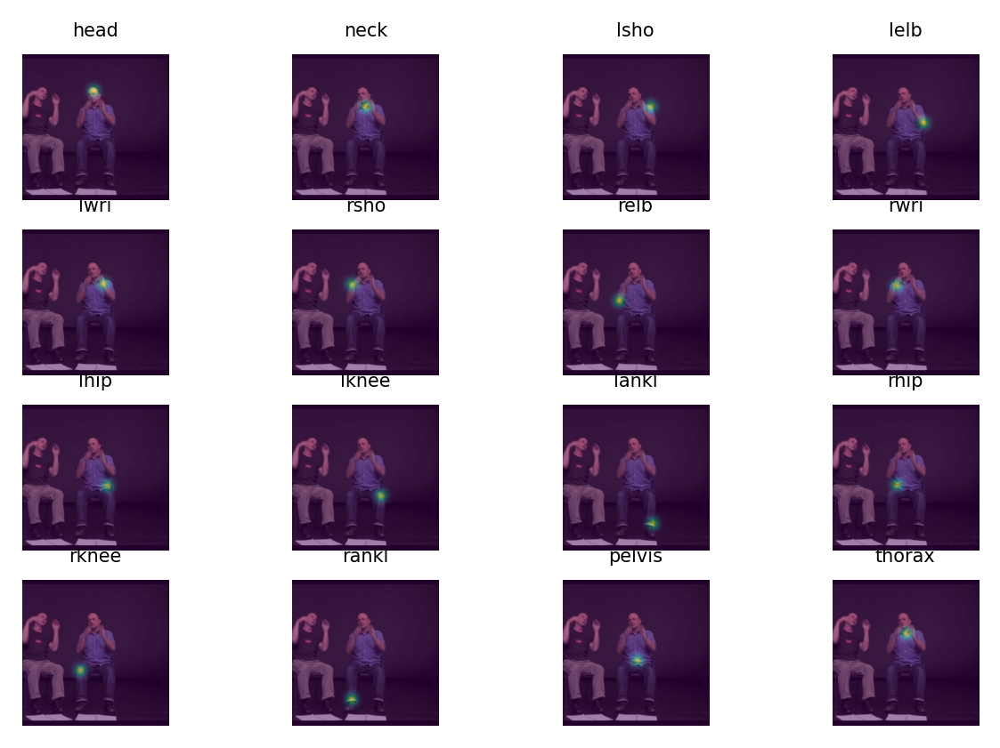

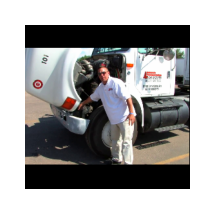

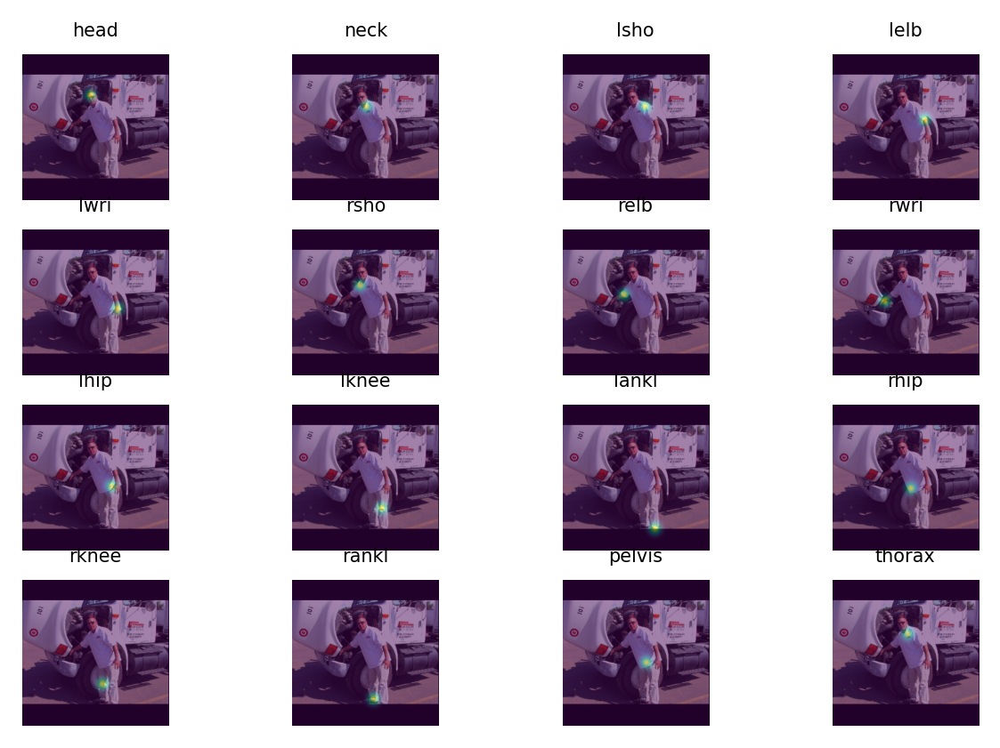

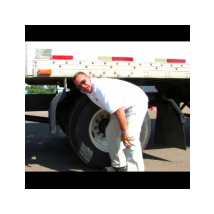

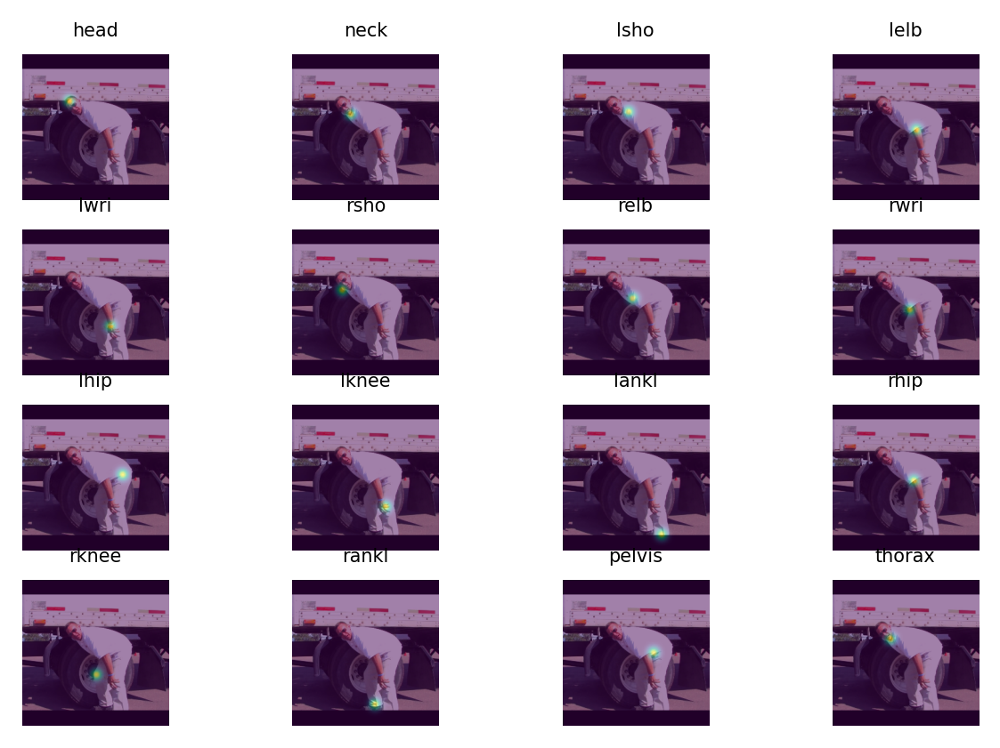

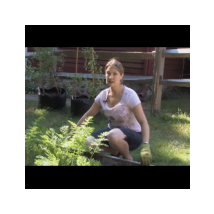

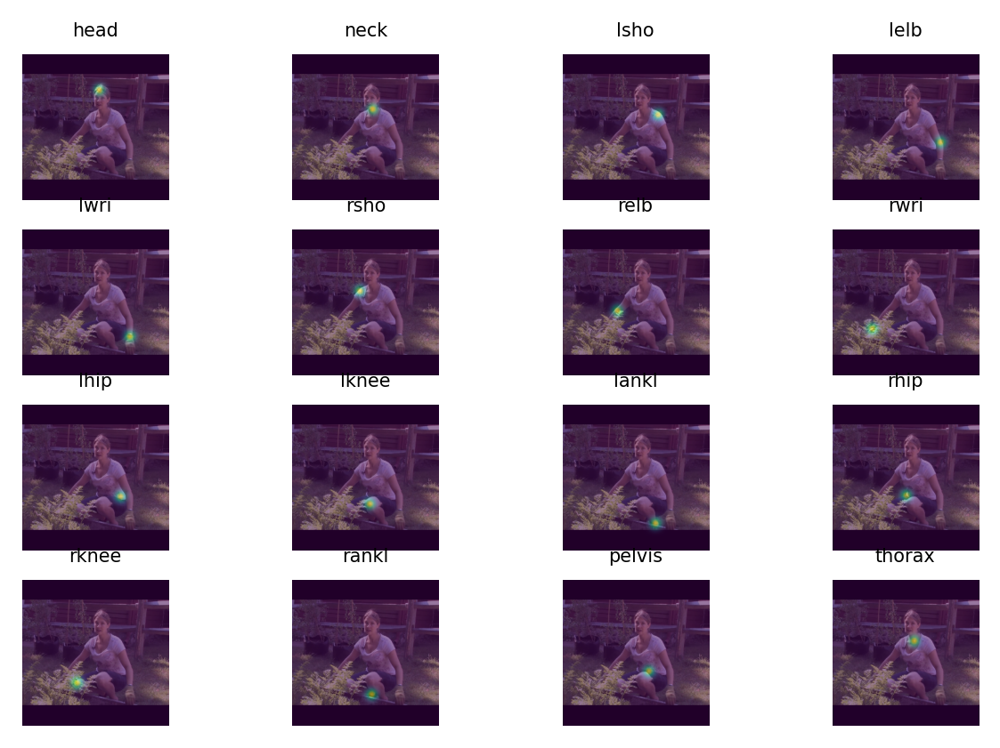

In [7]:
%matplotlib inline
matplotlib.rc("figure", dpi=250)

def visualize_heatmaps(data_obj):
    '''
    Small code snippet to visualize heatmaps
    :return:
    '''
    data_obj.input_dataset(validate=True)
    
    for i in range(0, 5):
        image, hm, _, _, _, _, _, _, _, _, _ = data_obj.__getitem__(i)

        plt.subplot(4, 4, 1)
        plt.imshow(image.numpy())
        plt.axis('off')
        plt.show()
        
        
        for j in range(hm.shape[0]):
            
            plt.subplot(4, 4, j+1)
            plt.imshow(image.numpy())
            plt.subplot(4, 4, j+1)
            plt.imshow(cv2.resize(hm[j].numpy(), dsize=(256, 256), interpolation=cv2.INTER_CUBIC), alpha=.5)
            plt.title('{}'.format(data_obj.ind_to_jnt[j]), fontdict = {'fontsize' : 6})
            plt.axis('off')

        plt.show()
        plt.close()
        
# Deepcopy prevents any altering to the internal state of datasets
visualize_heatmaps(copy.deepcopy(datasets))

In [8]:
del activelearning
del pose_model, aux_net
torch.cuda.empty_cache()
logging.info('Re-Initializing (and loading) human pose network and auxiliary network.\n')
pose_model, aux_net = load_models(conf=conf, load_pose=conf.model['load'], load_aux=conf.model['aux_net']['load'],
                                  model_dir=conf.model['load_path'])

INFO:root:Re-Initializing (and loading) human pose network and auxiliary network.

INFO:root:Initializing Hourglass Network
INFO:root:Loading Pose model from: D:\WADLA Demo\Pretrained_MPII_256channels\
INFO:root:Successfully loaded Pose model.


Number of parameters (Hourglass): 8429088



INFO:root:Successful: Model transferred to GPUs.



### Declaring experiment settings:

We create an object (loosely called ```hyperparameters```) which contains hyperparameters and optimizer configuration required for training our models.

Optional: We also initialize TensorBoard based on our configurations.

In [9]:
logging.info('Initializing experiment settings.')
hyperparameters = define_hyperparams(conf=conf, pose_model=pose_model, aux_net=aux_net)

if conf.tensorboard:
    writer = SummaryWriter(log_dir=os.path.join(conf.model['save_path'], 'tensorboard'))
else:
    writer = None

INFO:root:Initializing experiment settings.
INFO:root:Initializing the hyperparameters for the experiment.
INFO:root:Parameters of PoseNet passed to Optimizer


### It's time to run the training loop!

In [10]:
if conf.train:
    train_obj = Train(pose_model=pose_model, aux_net=aux_net, hyperparameters=hyperparameters, 
                  dataset_obj=datasets, conf=conf, tb_writer=writer)

    train_obj.train_model()

    del train_obj
    # Reload the best model for metric evaluation
    
    conf.resume_training = False
    pose_model, _ = load_models(conf=conf, load_pose=True, load_aux=False, model_dir=conf.model['save_path'])

### It's time to run the evaluation loop!

INFO:root:Starting model inference
  0%|                                                                                          | 0/302 [00:00<?, ?it/s]

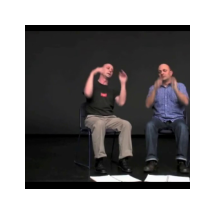

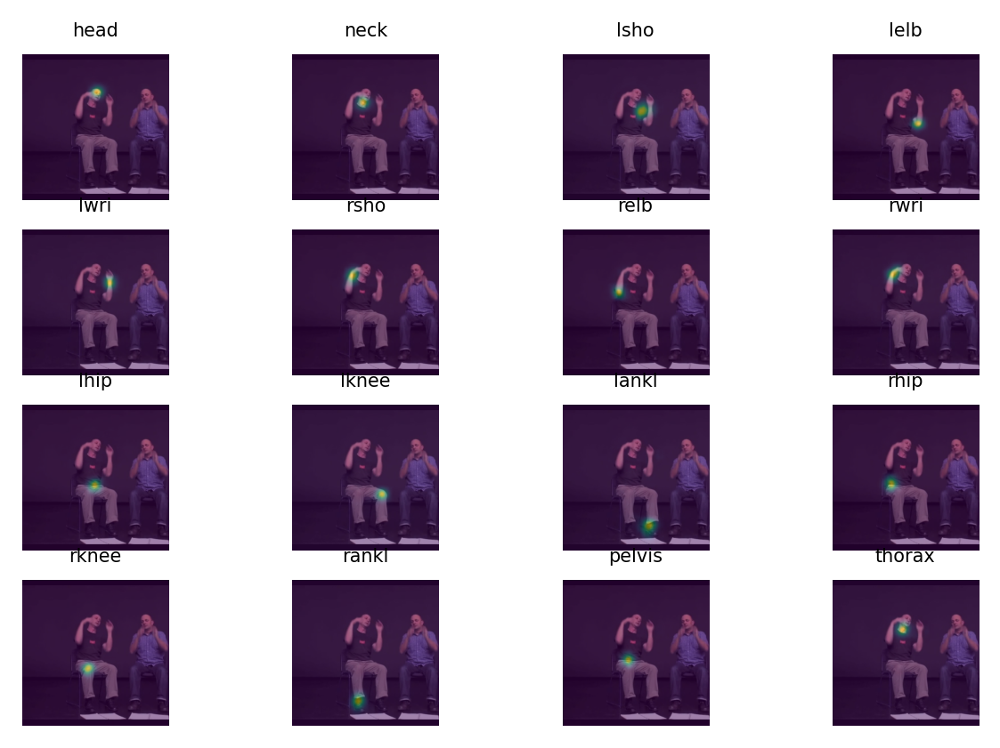

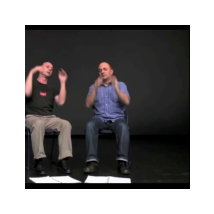

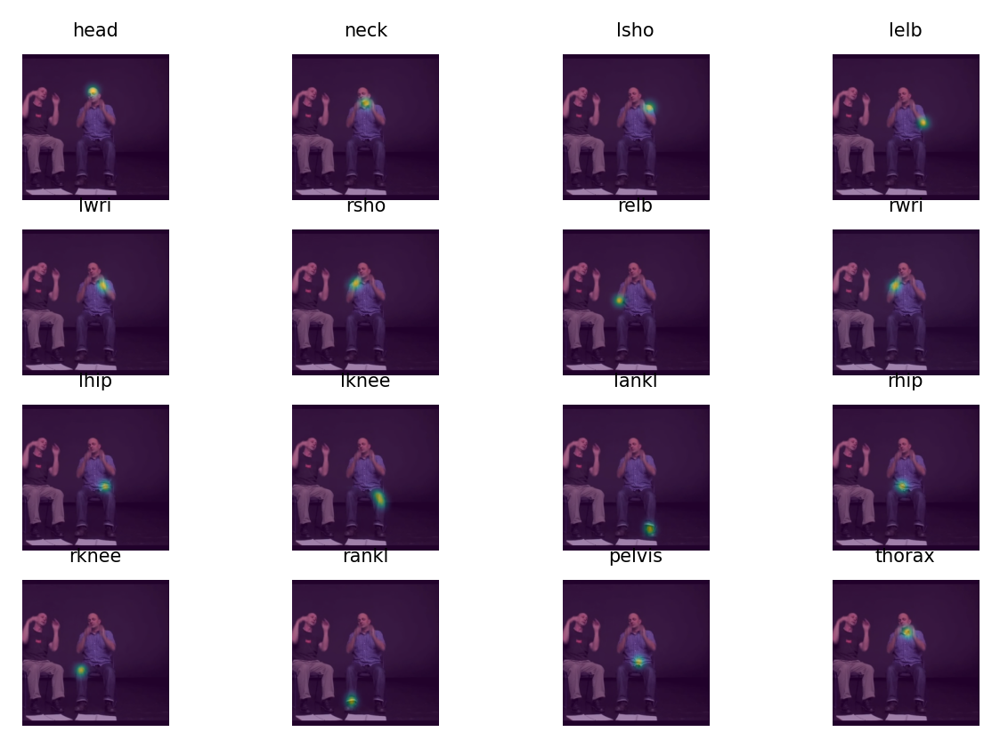

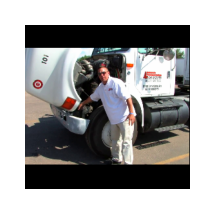

...

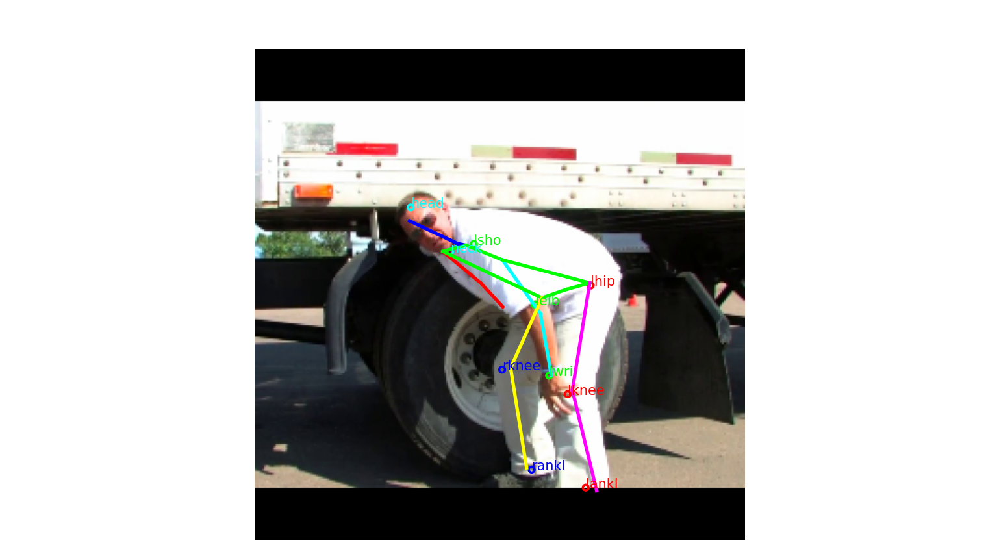

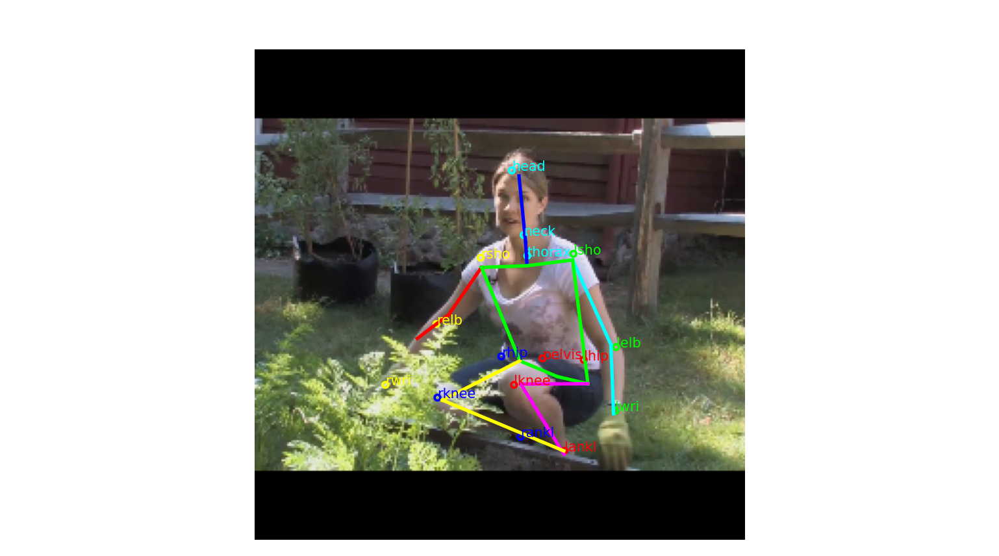

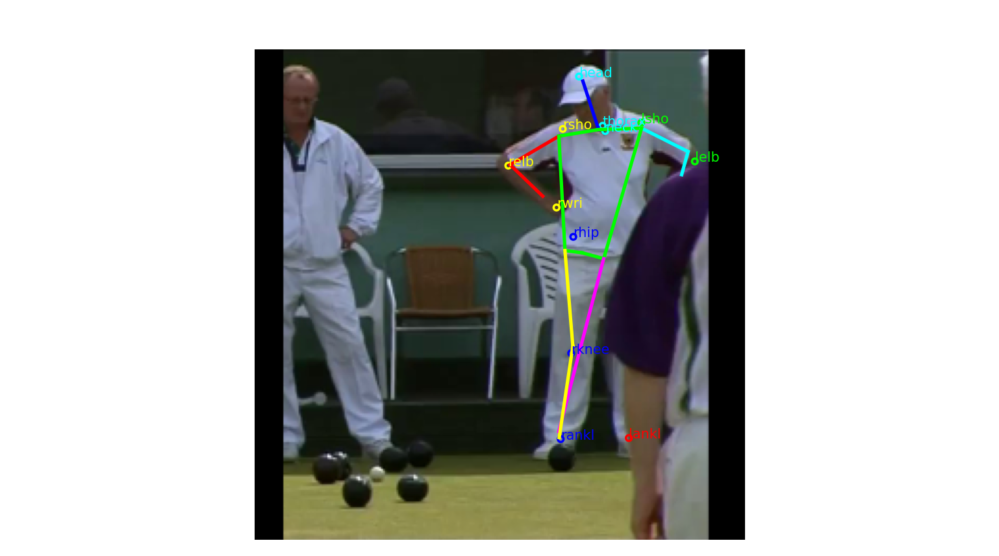

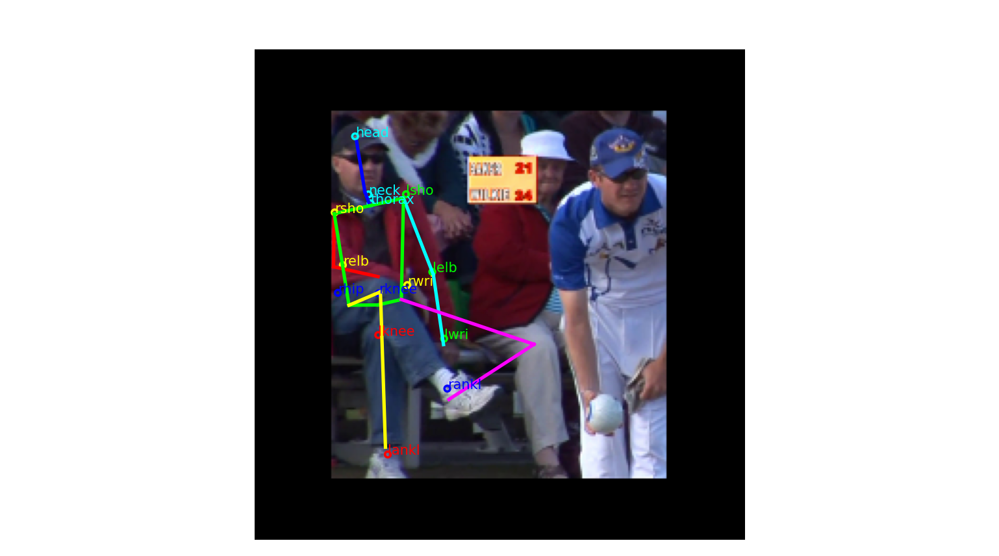

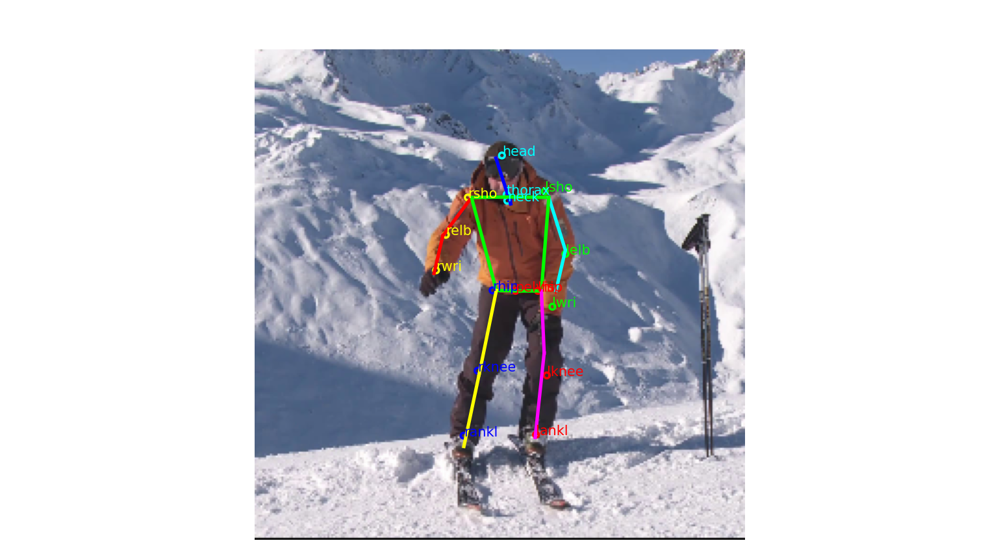

  0%|▎                                                                               | 1/302 [00:19<1:37:30, 19.44s/it]

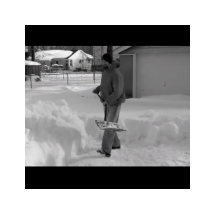

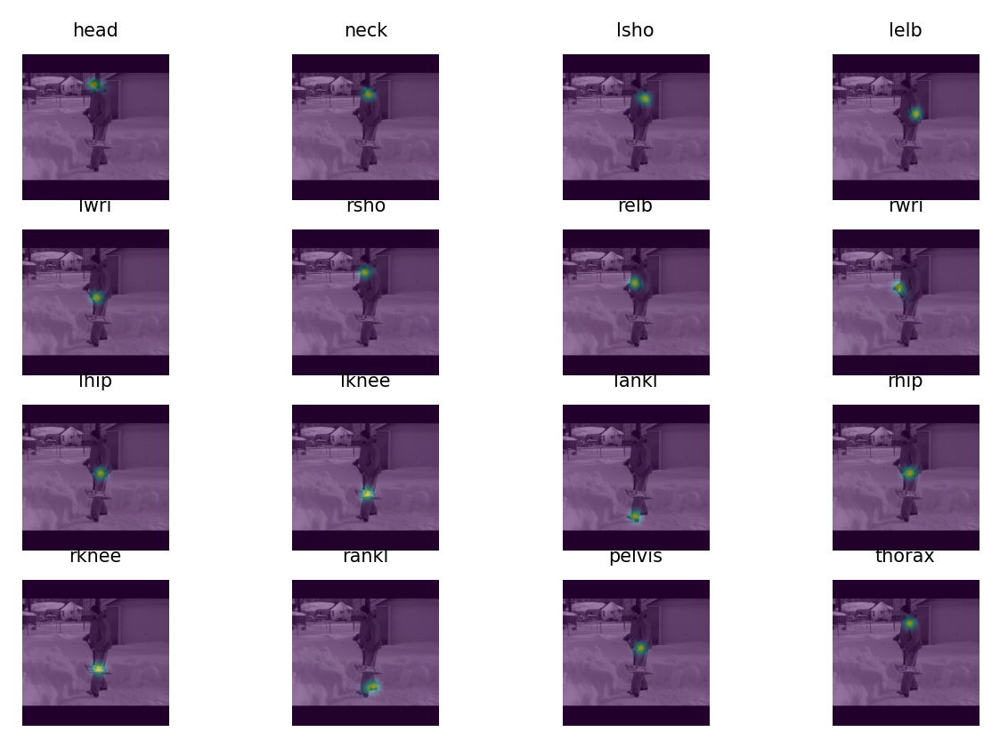

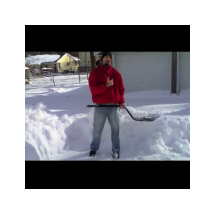

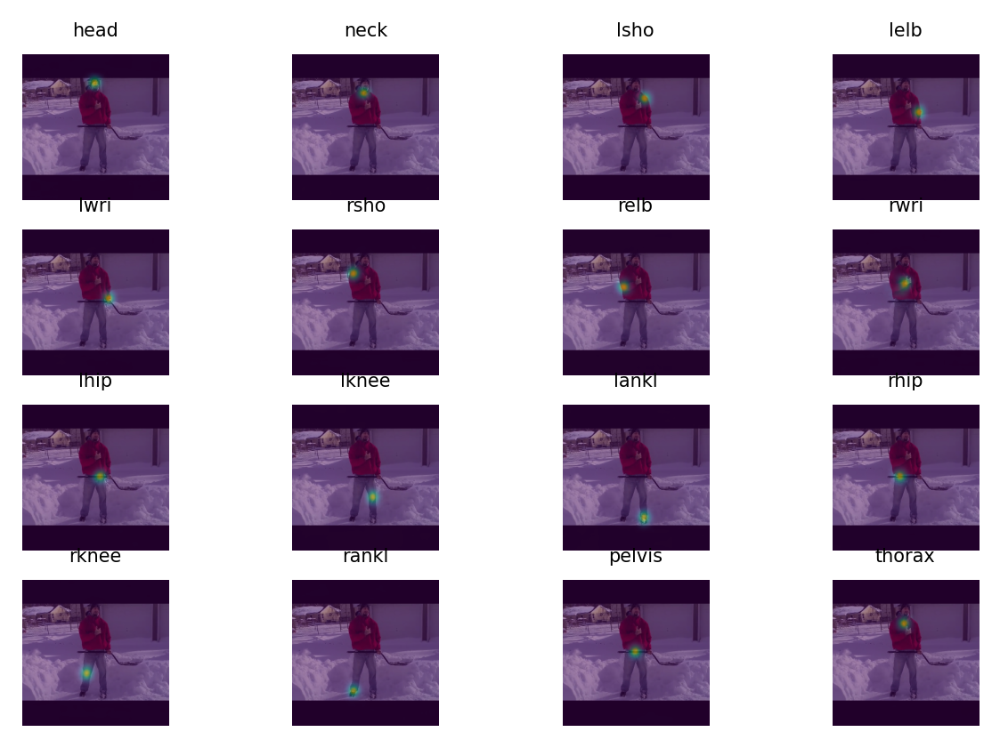

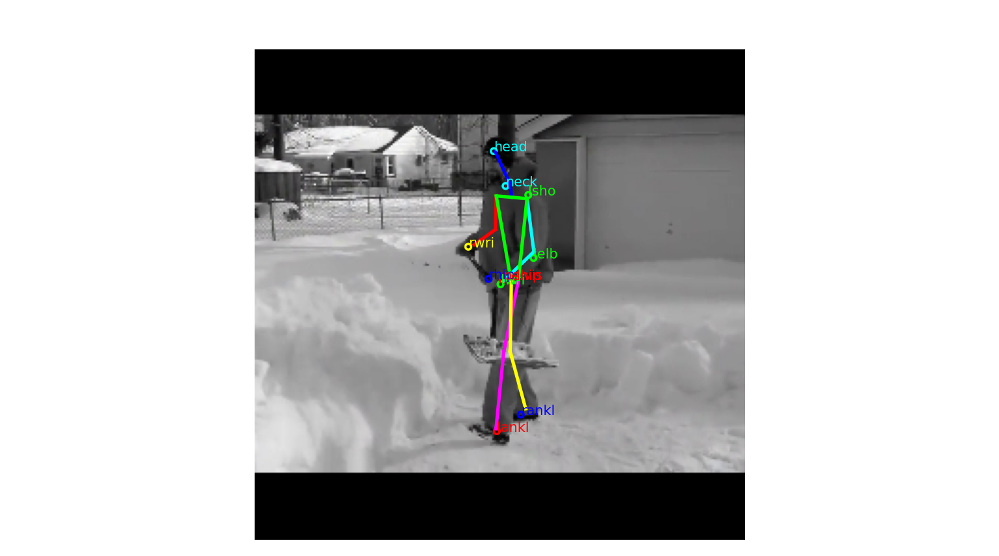

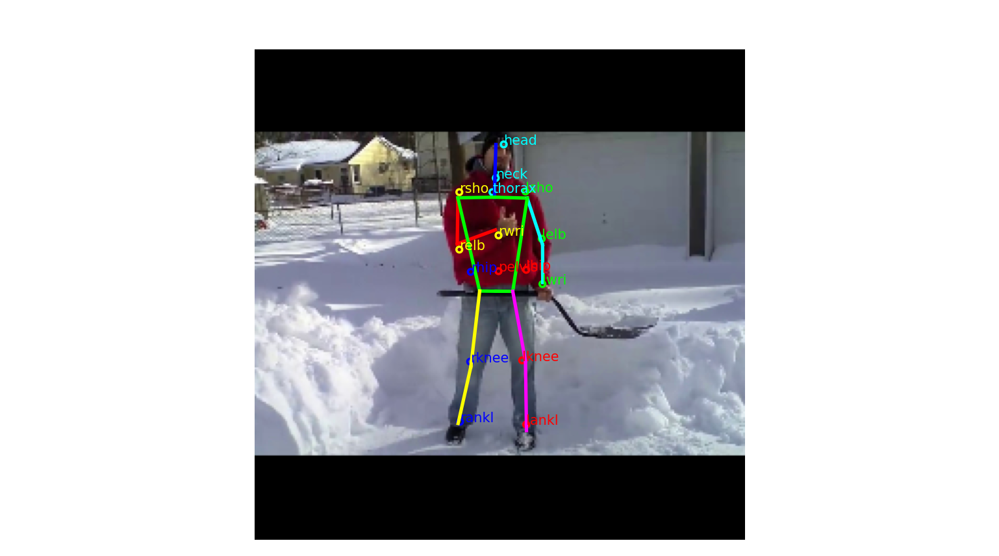

 94%|███████████████████████████████████████████████████████████████████████████▏    | 284/302 [10:37<00:39,  2.22s/it]

In [ ]:
%matplotlib inline
matplotlib.rc("figure", dpi=250)

if conf.metric:
    metric_obj = Metric(network=pose_model, dataset_obj=datasets, conf=conf)
    metric_obj.eval()